In [1]:
# analysis
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import warnings

from sklearn.model_selection import train_test_split

sns.set_style('darkgrid')
np.set_printoptions(precision=3)
warnings.filterwarnings("ignore")

### Cargar dataset

In [2]:
# url = ("https://www.kaggle.com/datasets/girishvutukuri/diabetes-binary-classification/download?datasetVersionNumber=1")
# data = pd.read_csv(url, header=None)

data = pd.read_csv("Datasets/Asteroid nasa 5yrs.csv")

print(f'Número de filas: {data.shape[0]}, Númerode columnas:{data.shape[1]}')
data.head()

Número de filas: 4687, Númerode columnas:40


,Neo Reference ID,Name,Absolute Magnitude,Est Dia in KM(min),Est Dia in KM(max),Est Dia in M(min),Est Dia in M(max),Est Dia in Miles(min),Est Dia in Miles(max),Est Dia in Feet(min),...,Asc Node Longitude,Orbital Period,Perihelion Distance,Perihelion Arg,Aphelion Dist,Perihelion Time,Mean Anomaly,Mean Motion,Equinox,Hazardous
0,3703080,3703080,21.6,0.127220,0.284472,127.219879,284.472297,0.079051,0.176763,417.388066,...,314.373913,609.599786,0.808259,57.257470,2.005764,2.458162e+06,264.837533,0.590551,J2000,True
1,3723955,3723955,21.3,0.146068,0.326618,146.067964,326.617897,0.090762,0.202951,479.225620,...,136.717242,425.869294,0.718200,313.091975,1.497352,2.457795e+06,173.741112,0.845330,J2000,False
2,2446862,2446862,20.3,0.231502,0.517654,231.502122,517.654482,0.143849,0.321655,759.521423,...,259.475979,643.580228,0.950791,248.415038,1.966857,2.458120e+06,292.893654,0.559371,J2000,True
3,3092506,3092506,27.4,0.008801,0.019681,8.801465,19.680675,0.005469,0.012229,28.876199,...,57.173266,514.082140,0.983902,18.707701,1.527904,2.457902e+06,68.741007,0.700277,J2000,False
4,3514799,3514799,21.6,0.127220,0.284472,127.219879,284.472297,0.079051,0.176763,417.388066,...,84.629307,495.597821,0.967687,158.263596,1.483543,2.457814e+06,135.142133,0.726395,J2000,True


In [3]:
# [colname for colname in data.columns]

### Análisis Exploratorio (EDA)

(Muy breve, no nos centraremos en el EDA en esta tarea)

In [4]:
data.dtypes

Neo Reference ID                  int64
Name                              int64
Absolute Magnitude              float64
Est Dia in KM(min)              float64
Est Dia in KM(max)              float64
Est Dia in M(min)               float64
Est Dia in M(max)               float64
Est Dia in Miles(min)           float64
Est Dia in Miles(max)           float64
Est Dia in Feet(min)            float64
Est Dia in Feet(max)            float64
Close Approach Date              object
Epoch Date Close Approach         int64
Relative Velocity km per sec    float64
Relative Velocity km per hr     float64
Miles per hour                  float64
Miss Dist.(Astronomical)        float64
Miss Dist.(lunar)               float64
Miss Dist.(kilometers)          float64
Miss Dist.(miles)               float64
Orbiting Body                    object
Orbit ID                          int64
Orbit Determination Date         object
Orbit Uncertainity                int64
Minimum Orbit Intersection      float64


### Descartar variables irrelevantes o redundantes
Irrelevantes:
- Neo Reference ID (Near Earth Object ID)
- Name (NEO name)
- Orbiting Body (siempre es Earth)
- Equinox (solo tiene 1 valor único)

Redundantes:
- Est Dia in KM(min)
- Est Dia in KM(max)
- Est Dia in Miles(min)
- Est Dia in Miles(max)
- Est Dia in Feet(min)
- Est Dia in Feet(max)
- Relative Velocity km per hr
- Miles per hour
- Miss Dist.(lunar)
- Miss Dist.(kilometers)
- Miss Dist.(miles)

Otras (no las vamos a usar para no complicarnos):
- Close Approach Date: fecha más cercana en la que el objeto se acerca a la Tierra
- Epoch Date Close Approach: fecha en que se calculó el acercamiento más cercano
- Orbit ID: identificador único para la órbita del objeto cercano a la Tierra
- Orbit Determination Date
- Epoch Osculation: la fecha y hora en que se midieron los datos de la órbita
- Perihelion Time: la fecha y hora en que el asteroide está en el punto más cercano al Sol

----------
Nos quedamos con:
* Est Dia in M(min): diámetro estimado del objeto cercano a la Tierra en metros (mínimo)
* Est Dia in M(max): diámetro estimado del objeto cercano a la Tierra en metros (máximo)
* Relative Velocity km per sec: velocidad relativa del objeto cercano a la Tierra en km por segundo
* Miss Dist.(Astronomical): distancia mínima entre el objeto cercano a la Tierra y la Tierra en unidades astronómicas (UA)
* Orbit Uncertainity: medida de la incertidumbre en la órbita del objeto cercano a la Tierra
* Minimum Orbit Intersection: distancia mínima entre la órbita del objeto cercano a la Tierra y la órbita de la Tierra en unidades astronómicas (UA)
* Eccentricity: medida de la forma de la órbita del objeto cercano a la Tierra
* Semi Major Axis: la mitad del eje mayor de la elipse que describe la órbita del objeto cercano a la Tierra
* Inclination: el ángulo entre el plano de la órbita del asteroide y el plano de la órbita de la Tierra
* Asc Node Longitude: la posición del punto donde la órbita del asteroide cruza el plano de la órbita de la Tierra, medido en grados desde un punto de referencia
* Orbital Period: el tiempo que tarda el asteroide en dar una vuelta completa alrededor del Sol
* Perihelion Distance: la distancia más cercana que el asteroide llega al Sol
* Aphelion Dist: la distancia más lejana que el asteroide se aleja del Sol
* Mean Anomaly: la posición del asteroide a lo largo de su órbita medida desde un punto de referencia
* Mean Motion: la velocidad promedio del asteroide a lo largo de su órbita

Duda:
* Jupiter Tisserand Invariant: una medida de la relación del objeto cercano a la Tierra con Júpiter
* Perihelion Arg: la posición del asteroide en su órbita cuando está en el punto más cercano al Sol


In [5]:
selected_features = ['Est Dia in M(min)', 'Est Dia in M(max)',
                     'Relative Velocity km per sec', 'Miss Dist.(Astronomical)',
                     'Orbit Uncertainity', 'Minimum Orbit Intersection',
                     'Eccentricity', 'Semi Major Axis', 'Inclination',
                     'Asc Node Longitude', 'Orbital Period', 
                     'Perihelion Distance', 'Aphelion Dist', 
                     'Mean Anomaly', 'Mean Motion',
                     'Jupiter Tisserand Invariant', 'Perihelion Arg',
                     'Hazardous'] # no olvidar incluir la varObj

data = data[selected_features]
data.head()

,Est Dia in M(min),Est Dia in M(max),Relative Velocity km per sec,Miss Dist.(Astronomical),Orbit Uncertainity,Minimum Orbit Intersection,Eccentricity,Semi Major Axis,Inclination,Asc Node Longitude,Orbital Period,Perihelion Distance,Aphelion Dist,Mean Anomaly,Mean Motion,Jupiter Tisserand Invariant,Perihelion Arg,Hazardous
0,127.219879,284.472297,6.115834,0.419483,5,0.025282,0.425549,1.407011,6.025981,314.373913,609.599786,0.808259,2.005764,264.837533,0.590551,4.634,57.257470,True
1,146.067964,326.617897,18.113985,0.383014,3,0.186935,0.351674,1.107776,28.412996,136.717242,425.869294,0.718200,1.497352,173.741112,0.845330,5.457,313.091975,False
2,231.502122,517.654482,7.590711,0.050956,0,0.043058,0.348248,1.458824,4.237961,259.475979,643.580228,0.950791,1.966857,292.893654,0.559371,4.557,248.415038,True
3,8.801465,19.680675,11.173874,0.285322,6,0.005512,0.216578,1.255903,7.905894,57.173266,514.082140,0.983902,1.527904,68.741007,0.700277,5.093,18.707701,False
4,127.219879,284.472297,9.840831,0.407832,1,0.034798,0.210448,1.225615,16.793382,84.629307,495.597821,0.967687,1.483543,135.142133,0.726395,5.154,158.263596,True


In [6]:
data.nunique()

Est Dia in M(min)                269
Est Dia in M(max)                269
Relative Velocity km per sec    4687
Miss Dist.(Astronomical)        4673
Orbit Uncertainity                10
Minimum Orbit Intersection      3678
Eccentricity                    3692
Semi Major Axis                 3692
Inclination                     3692
Asc Node Longitude              3692
Orbital Period                  3692
Perihelion Distance             3692
Aphelion Dist                   3692
Mean Anomaly                    3692
Mean Motion                     3692
Jupiter Tisserand Invariant     2495
Perihelion Arg                  3692
Hazardous                          2
dtype: int64

In [7]:
data.describe(include='all').round(2) # (include serviría si hubiera categóricas)

,Est Dia in M(min),Est Dia in M(max),Relative Velocity km per sec,Miss Dist.(Astronomical),Orbit Uncertainity,Minimum Orbit Intersection,Eccentricity,Semi Major Axis,Inclination,Asc Node Longitude,Orbital Period,Perihelion Distance,Aphelion Dist,Mean Anomaly,Mean Motion,Jupiter Tisserand Invariant,Perihelion Arg,Hazardous
count,4687.00,4687.00,4687.00,4687.00,4687.00,4687.00,4687.00,4687.00,4687.00,4687.00,4687.00,4687.00,4687.00,4687.00,4687.00,4687.00,4687.00,4687
unique,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2
top,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,False
freq,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3932
mean,204.60,457.51,13.97,0.26,3.52,0.08,0.38,1.40,13.37,172.16,635.58,0.81,1.99,181.17,0.74,5.06,183.93,NaN
std,369.57,826.39,7.29,0.15,3.08,0.09,0.18,0.52,10.94,103.28,370.95,0.24,0.95,107.50,0.34,1.24,103.51,NaN
min,1.01,2.26,0.34,0.00,0.00,0.00,0.01,0.62,0.01,0.00,176.56,0.08,0.80,0.00,0.09,2.20,0.01,NaN
25%,33.46,74.82,8.43,0.13,0.00,0.01,0.24,1.00,4.96,83.08,365.61,0.63,1.27,87.01,0.45,4.05,95.63,NaN
50%,110.80,247.77,12.92,0.27,3.00,0.05,0.37,1.24,10.31,172.63,504.95,0.83,1.62,185.72,0.71,5.07,189.76,NaN
75%,253.84,567.60,18.08,0.38,6.00,0.12,0.51,1.68,19.51,255.03,794.20,1.00,2.45,276.53,0.98,6.02,271.78,NaN


### Matriz de correlación

Las variabs que tengan corr de valor absoluto = 1 (o muy cercano a 1) son colineales, ie contienen la misma información, y por tanto generarán problemas en algunos algoritmos de predicción. En otros, sencillamente no serán variabs importantes. De todas formas, es conveniente descartar una de las dos variabs correlacionadas.

La decisión de eliminar una variable debe basarse en el conocimiento del dominio y en la interpretación de los datos (así como en la capacidad de explicar la variabilidad en los datos), y no solo en el valor de la correlación.

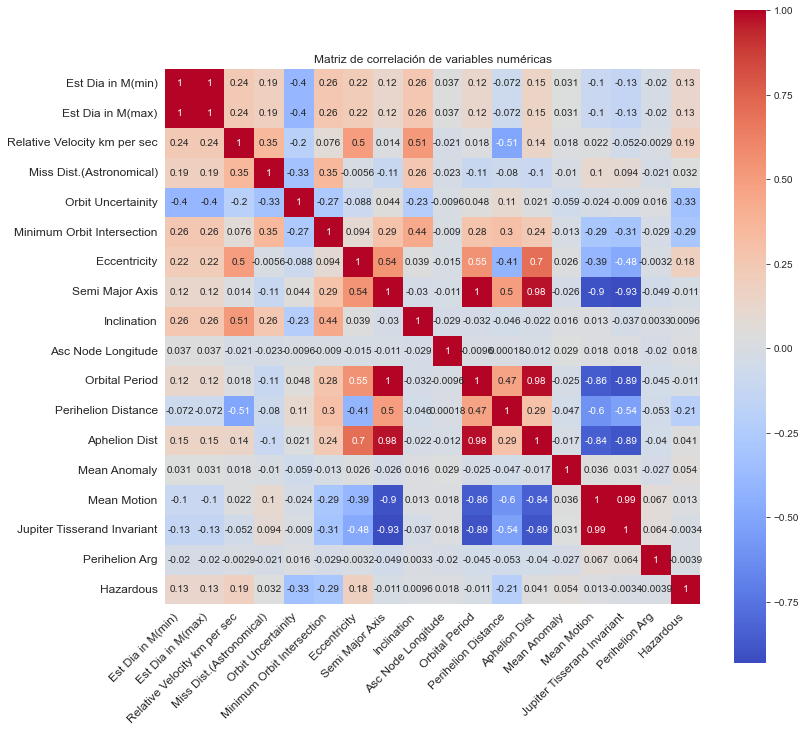

In [8]:
# Matriz de correlación
corr_matrix = data.corr()

# Visualizar corr_matrix
plt.subplots(figsize=(12,12))
sns.heatmap(corr_matrix, cmap='coolwarm', annot=True, annot_kws={'fontsize':10}, square=True)
plt.xticks(rotation=45, ha='right', fontsize=12)
plt.yticks(rotation=0, fontsize=12)
plt.title('Matriz de correlación de variables numéricas')
plt.show()

Las variables con correlaciones cercanas a 1 son:
- Est Dia (min) y (max) contienen información similar a nivel físico
- Semi Major Axis, Orbital Period y Aphelion Dist son magnitudes físicas que están estrechamente relacionadas
- Jupiter Tisserand Invariant (info referente a Júpiter) y Mean Motion (velocidad promedio) podrían también ser magnitudes físicas relacionadas (aunque en este caso, lo desconocemos; lo ideal en un caso real sería consultar al experto en los datos para confirmar nuestras sospechas)

In [9]:
# Eliminar variabs colineales
data = data.drop(['Est Dia in M(min)','Orbital Period','Aphelion Dist','Jupiter Tisserand Invariant'], axis=1)
data.head()

,Est Dia in M(max),Relative Velocity km per sec,Miss Dist.(Astronomical),Orbit Uncertainity,Minimum Orbit Intersection,Eccentricity,Semi Major Axis,Inclination,Asc Node Longitude,Perihelion Distance,Mean Anomaly,Mean Motion,Perihelion Arg,Hazardous
0,284.472297,6.115834,0.419483,5,0.025282,0.425549,1.407011,6.025981,314.373913,0.808259,264.837533,0.590551,57.257470,True
1,326.617897,18.113985,0.383014,3,0.186935,0.351674,1.107776,28.412996,136.717242,0.718200,173.741112,0.845330,313.091975,False
2,517.654482,7.590711,0.050956,0,0.043058,0.348248,1.458824,4.237961,259.475979,0.950791,292.893654,0.559371,248.415038,True
3,19.680675,11.173874,0.285322,6,0.005512,0.216578,1.255903,7.905894,57.173266,0.983902,68.741007,0.700277,18.707701,False
4,284.472297,9.840831,0.407832,1,0.034798,0.210448,1.225615,16.793382,84.629307,0.967687,135.142133,0.726395,158.263596,True


In [10]:
# variabs numéricas (incl a la categ pq sus categorías son int)

numeric_features = ['Est Dia in M(max)', 'Relative Velocity km per sec',
                    'Miss Dist.(Astronomical)',
                    'Orbit Uncertainity', 'Minimum Orbit Intersection',
                    'Eccentricity', 'Semi Major Axis', 'Inclination',
                    'Asc Node Longitude', 'Perihelion Distance', 
                    'Mean Anomaly', 'Mean Motion',
                    'Perihelion Arg']

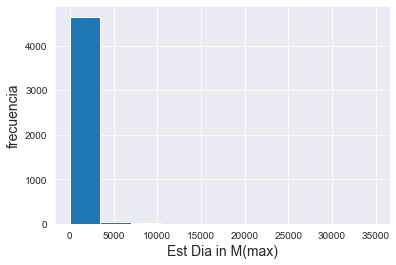

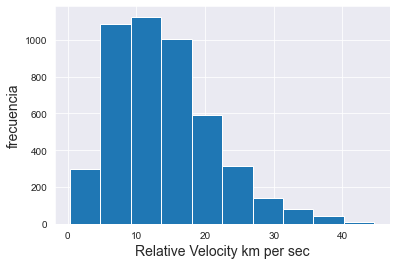

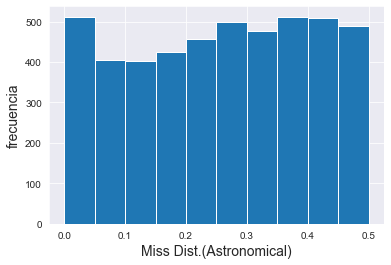

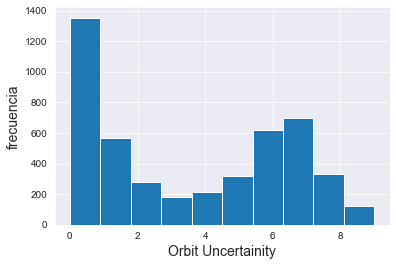

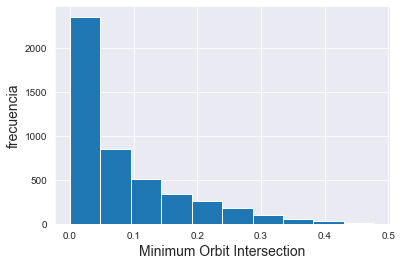

...

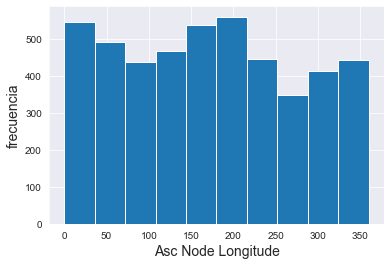

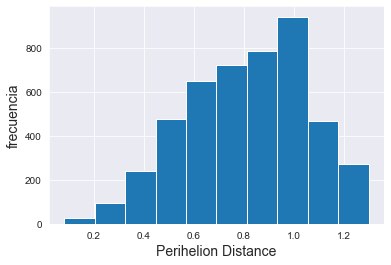

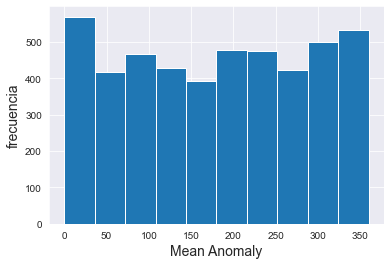

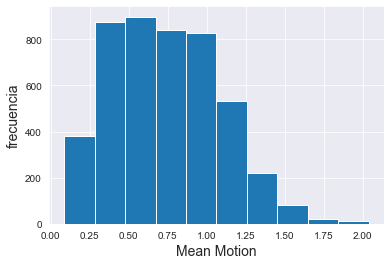

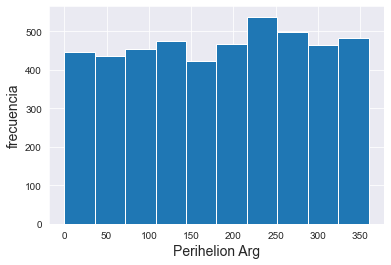

In [12]:
# Distribución de las variabs (veamos cuáles son gaussianas)
for variab in numeric_features:
    plt.hist(data[variab], bins=10)
    plt.xlabel(variab, fontsize=14)
    plt.ylabel('frecuencia', fontsize=14)
    plt.show()

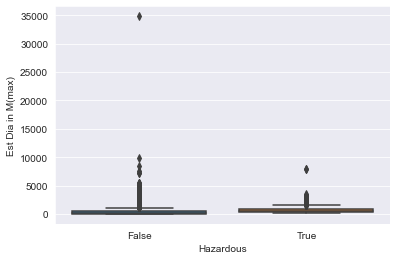

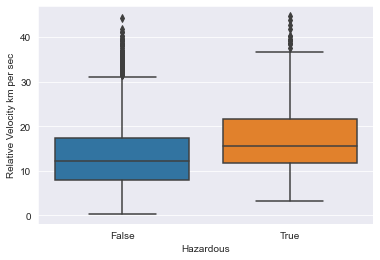

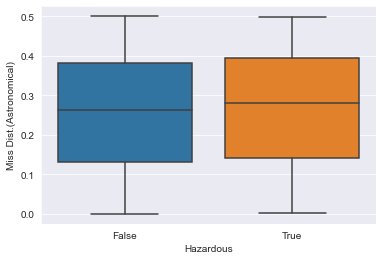

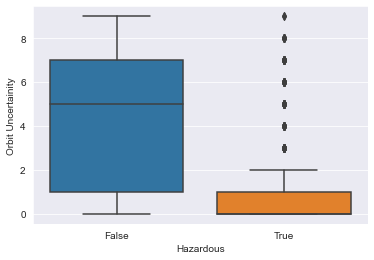

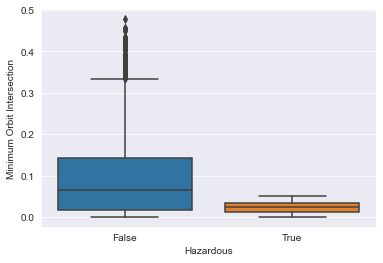

...

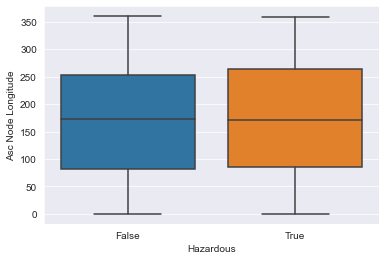

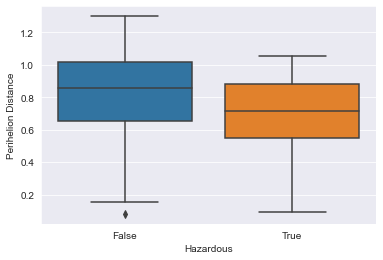

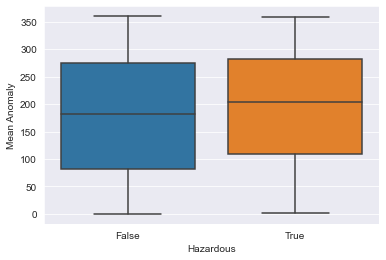

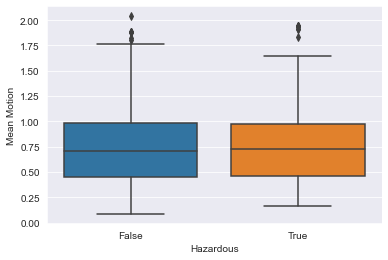

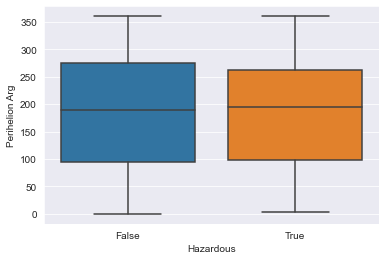

In [12]:
# Relación entre cada variab numéricas y la varObj
for variab in numeric_features:
    sns.boxplot(x='Hazardous', y=variab, data=data)
    plt.show()
    
# Est Dia in M(max) tiene casi todos valores pequeños, pero tiene algunos muuuuy grandes,
# quizás podemos "reducirlos", ya que aunque pueden ser valores reales y no atípicos, nos interesa 
# que no haya tanta diferencia con la mayoría, de cara a la estandarización

In [13]:
# # Repetimos, pero sin plotear posibles outliers

# # En algunos casos, sí mejora la visibilidad!
# # Y vemos qué variabs pueden ser buenas predictoras y cuáles no (*)
# # (*) aunque falta considerar transformaciones e iteracciones

# for variab in numeric_features:
#     sns.boxplot(x='Hazardous', y=variab, data=data, showfliers=False)
#     plt.show()

### Outliers

In [14]:
## Función para gestionar outliers
from scipy.stats.mstats import winsorize

def gestiona_outliers(col, clas='check'):
    # el arg clas toma valores: check, winsor y miss (leer abajo)

    # Condición de asimetría y aplicación de criterio 1 según el caso
    if abs(col.skew()) < 1:
        criterio1 = abs((col - col.mean()) / col.std()) > 3
    else:
        criterio1 = abs((col - col.median()) / col.mad()) > 8

    # Calcular primer cuartil
    q1 = col.quantile(0.25)
    # Calcular tercer cuartil
    q3 = col.quantile(0.75)
    # Calculo de IQR
    IQR = q3 - q1
    # Calcular criterio 2 (general para cualquier asimetría)
    criterio2 = (col < (q1 - 3 * IQR)) | (col > (q3 + 3 * IQR))
    lower = col[criterio1 & criterio2 & (col < q1)].count() / col.dropna().count()
    upper = col[criterio1 & criterio2 & (col > q3)].count() / col.dropna().count()
    # Salida según el tipo deseado
    if clas == 'check':
        return lower * 100, upper * 100, (lower + upper) * 100
    elif clas == 'winsor':
        return winsorize(col, limits=[lower,upper])
    elif clas == 'miss':
        print('\n MissingAntes: ' + str(col.isna().sum()))
        col.loc[criterio1 & criterio2] = np.nan
        print('MissingDespues: ' + str(col.isna().sum()) + '\n')
        return col

- check: comprobar si hay outliers

- winsorizar: colapsar todo valor mayor o menor que los umbrales de cierto rango (dado por percentiles habitualmente) para igualarlo con esos umbrales. Este método conserva la integridad del datos en el sentido de que si, por ej, era muy grande por la derecha, ahora estará en el extremo; pero puede provocar carga excesiva de las colas de la distribución, generando quizá algunas rarezas en picos de densidad...

- miss: convertir en NAs

In [15]:
# Checkear outliers (variabs numéricas)

data[numeric_features].apply(lambda x: gestiona_outliers(x, clas='check'))

,Est Dia in M(max),Relative Velocity km per sec,Miss Dist.(Astronomical),Orbit Uncertainity,Minimum Orbit Intersection,Eccentricity,Semi Major Axis,Inclination,Asc Node Longitude,Perihelion Distance,Mean Anomaly,Mean Motion,Perihelion Arg
0,0.000000,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0
1,0.832089,0.0,0.0,0.0,0.0,0.0,0.021336,0.0,0.0,0.0,0.0,0.0,0.0
2,0.832089,0.0,0.0,0.0,0.0,0.0,0.021336,0.0,0.0,0.0,0.0,0.0,0.0


En nuestro caso, trabajamos con datos de la NASA, seguramente sean muy precisos y, por tanto, correctos.
Lo que haremos será **winsorizar** los "outliers", pues parece haber pocos outliers (los extremos no 
se van a saturar), y además es justamente lo que queremos: sin perder la esencia de la información,
queremos reducir distancias de esos "outliers" con el resto de asteroides, para luego tener una 
estandarización menos abrupta.

In [16]:
# winsorizar outliers

# Crear copia para evitar pisar información
variab_num = data[numeric_features].copy()

variab_num_w = variab_num.apply(lambda x: gestiona_outliers(x, clas='winsor'))

In [17]:
# # Comprobar que ningún registro ha pasado a NA
variab_num_w.isna().sum()

Est Dia in M(max)               0
Relative Velocity km per sec    0
Miss Dist.(Astronomical)        0
Orbit Uncertainity              0
Minimum Orbit Intersection      0
Eccentricity                    0
Semi Major Axis                 0
Inclination                     0
Asc Node Longitude              0
Perihelion Distance             0
Mean Anomaly                    0
Mean Motion                     0
Perihelion Arg                  0
dtype: int64

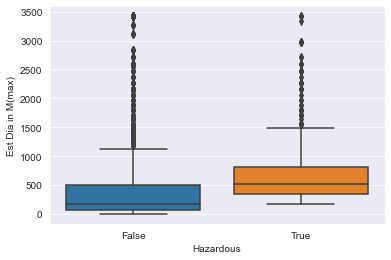

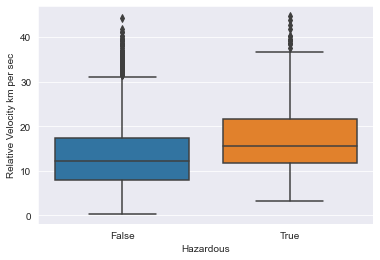

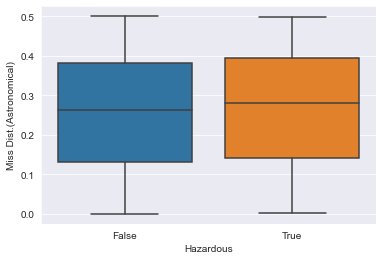

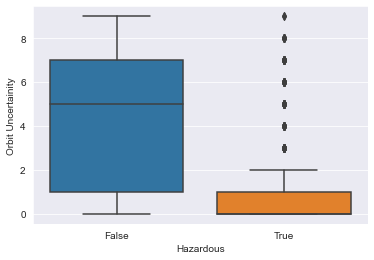

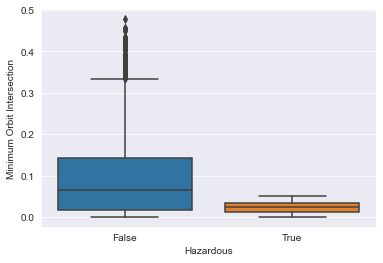

...

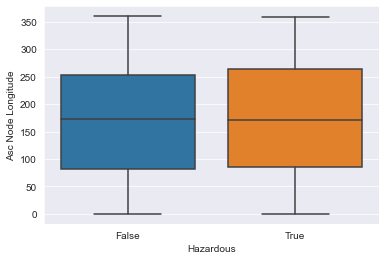

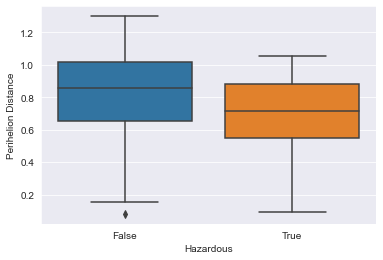

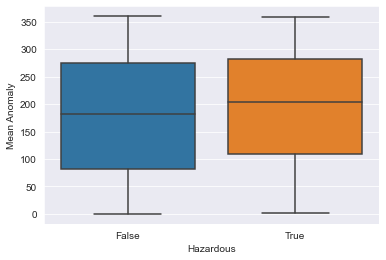

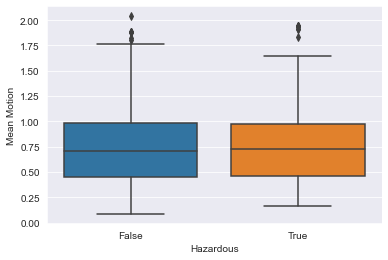

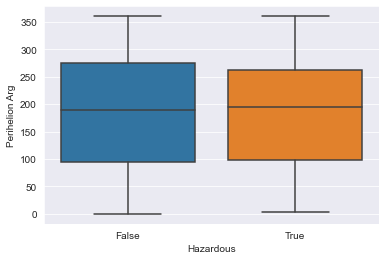

In [18]:
# (repetir sin "outliers") Relación entre cada variab numéricas y la varObj

# redefinir el dataset, ie juntar las cols winsorized con las variabs categ y la varObj
data = variab_num_w.join(data.select_dtypes(exclude=np.number))

for variab in numeric_features:
    sns.boxplot(x='Hazardous', y=variab, data=data) # cambia el data
    plt.show()

# Parece que hemos logrado el efecto deseado :)

In [19]:
# Imputar (si hubiera missings)

# imputer1 = SimpleImputer(strategy='median')
# imputer2 = SimpleImputer(strategy='most_frequent')
# imputer3 = KNNImputer(n_neighbors=5, metric='nan_euclidean') # busca los k-vecinos (*) e imputa con, por ej, la media de esos k vecinos

# df3 = df.copy()

# df3['Age'] = imputer2.fit_transform(df3[['Age']]) # SimpleImputer solo necesita la variab que vamos a imputar

# df4 = df.copy()

# key_cols = ['Pclass', 'Age', 'SibSp', 'Parch', 'Fare'] # tienen que ser numéricas
# imputer3.fit(df[key_cols]) # fitteamos con esas variabs
# df4[key_cols] = imputer3.transform(df4[key_cols]) # transformamos

_Nota: no he priorizado escoger un dataset sin missings porque esto ya lo he practicado en otras tareas_

### Necesitamos una variab categ

La variab 'Orbit Uncertainity' es la única que, aun siendo numérica, solo toma valores enteros del 0 al 9

In [20]:
((data["Orbit Uncertainity"].value_counts()).cumsum() / data["Orbit Uncertainity"].count() * 100).round(2)

# desafortunadamente, los porcentajes están muy repartidos, y categorizarla en 10 categorías no es lo ideal (son "muchas")

0     28.87
7     43.80
6     57.03
1     69.15
8     76.17
5     83.02
2     88.97
4     93.49
3     97.38
9    100.00
Name: Orbit Uncertainity, dtype: float64

In [21]:
# # Relación con la varObj

# # Crear una tabla de contingencia de las variables numérica y binaria
# contingency_table = pd.crosstab(data["Orbit Uncertainity"], data["Hazardous"])

# # Crear un gráfico de barras apiladas
# contingency_table.plot(kind='bar', stacked=True)

# # Agregar etiquetas y título al gráfico
# plt.xlabel('Variable numérica')
# plt.ylabel('Conteo')
# plt.title('Relación entre variable numérica y variable binaria')

# # Mostrar el gráfico
# plt.show()

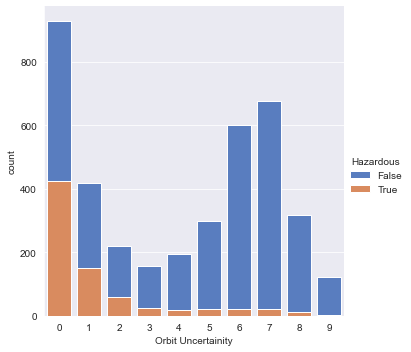

In [22]:
sns.catplot(x="Orbit Uncertainity", hue="Hazardous", kind='count', data=data,
           dodge=False, palette="muted") # dodge=False para que las columnas se superponan

Podemos agrupar por un lado las que son 0 (grupo numeroso + mayor presencia de 1's), por otro lado [3-9] ya que todas ellas tienen muy poca presencia de 1's y además, se mantiene la categorización continua (no mezclo 1 con 5 y 2 con 4 por ej), y por último [1-2], que más o menos son parecidas.

In [23]:
# Categorizar variab (3 categs)

data["Orbit Uncertainity (categ)"] = data["Orbit Uncertainity"].apply(lambda x:\
                                        "0" if x == 0 else "1-2" if x >= 1 and x <= 2 else "3-9")

data["Orbit Uncertainity (categ)"].value_counts()

3-9    2487
0      1353
1-2     847
Name: Orbit Uncertainity (categ), dtype: int64

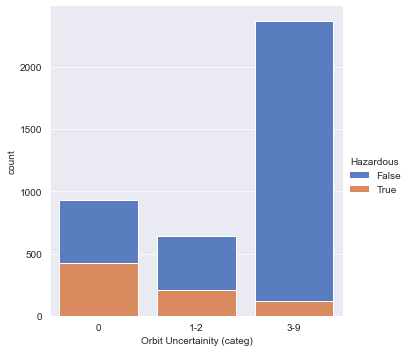

In [24]:
sns.catplot(x="Orbit Uncertainity (categ)", hue="Hazardous", kind='count', data=data,
            order=["0", "1-2", "3-9"], dodge=False, palette="muted")

Como las categs tienen distinta relación con la varObj, creo que puede servirnos para ilustrar el uso de variabs categ

(Nota: recuerda que el gráfico no significa que de categ 0, la mitad sean 0 y la otra mitad 1, sino que hay el doble de 0 que de 1)

---------

Apartado 4 de la tarea

Preprocesado de los datos de cara a construir una red neuronal:
- normalizar/escalar los datos
- codificar variabs categ
- tratamiento de missings
- reducir dimensionalidad, con selección de variabs, PCA, etc

### Preprocesado parte 1 (previo al train-test split)

In [25]:
# comprobar duplicates

data.duplicated().sum() # cuenta nº de filas duplicadas

## Si hubiera duplicados:
# data = data.drop_duplicates()

0

In [26]:
# comprobar valores incorrectos

data.dtypes # son todas numéricas, luego no hay datos "?", "NA", "null", etc.

Est Dia in M(max)               float64
Relative Velocity km per sec    float64
Miss Dist.(Astronomical)        float64
Orbit Uncertainity                int64
Minimum Orbit Intersection      float64
Eccentricity                    float64
Semi Major Axis                 float64
Inclination                     float64
Asc Node Longitude              float64
Perihelion Distance             float64
Mean Anomaly                    float64
Mean Motion                     float64
Perihelion Arg                  float64
Hazardous                          bool
Orbit Uncertainity (categ)       object
dtype: object

In [27]:
# comprobar missings

data.isna().sum()

Est Dia in M(max)               0
Relative Velocity km per sec    0
Miss Dist.(Astronomical)        0
Orbit Uncertainity              0
Minimum Orbit Intersection      0
Eccentricity                    0
Semi Major Axis                 0
Inclination                     0
Asc Node Longitude              0
Perihelion Distance             0
Mean Anomaly                    0
Mean Motion                     0
Perihelion Arg                  0
Hazardous                       0
Orbit Uncertainity (categ)      0
dtype: int64

False    3932
True      755
Name: Hazardous, dtype: int64 

False    83.89
True     16.11
Name: Hazardous, dtype: float64


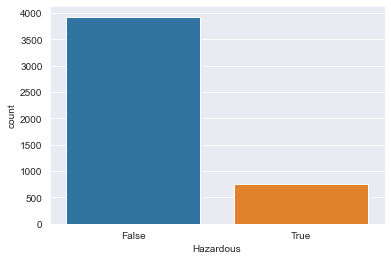

In [28]:
# comprobar desbalanceados

print(data.Hazardous.value_counts(), "\n")

print((data["Hazardous"].value_counts(normalize=True)*100).round(2))

sns.countplot(x='Hazardous', data=data)
plt.show()

Los datos están **desbalanceados**.

Más adelante, veremos qué hacer al respecto

In [29]:
# Definir X,y

# reemplazamos 'Orbit Uncertainity' por 'Orbit Uncertainity (categ)'
predictive_features = ['Est Dia in M(max)', 'Relative Velocity km per sec',
                    'Miss Dist.(Astronomical)',
                    'Orbit Uncertainity (categ)', 'Minimum Orbit Intersection',
                    'Eccentricity', 'Semi Major Axis', 'Inclination',
                    'Asc Node Longitude', 'Perihelion Distance', 
                    'Mean Anomaly', 'Mean Motion',
                    'Perihelion Arg']

X = data[predictive_features]

# comprobación
print(X.shape)

(4687, 13)


In [30]:
# Aprovechamos para convertir la varObj de (False, True) a (0, 1)
y = data["Hazardous"].astype(int)

# (También podría hacerse con .apply, con .loc, con LabelBinarizer()...
# pero esta forma es muy elegante ;)

print(y.shape)

(4687,)


------
## Transformación de variables

Buscamos las mejores transformaciones de las variabs numéricas.

Uso las funciones propias del profe de Python:
``"NuestrasFunciones.py"``

NOTA: lo ideal sería preparar un código que hiciera primero la división en conjunto de entrenamiento y de testeo, y después buscara las mejores transformaciones solo con train. Luego, para evaluar los modelos, habría que aplicar esas transformaciones (que incluyen escalado -ver el código abajo) sobre test.

No obstante, aquí hemos buscado las mejores transformaciones antes de dividir en train y test, para simplificarme un poco la vida y tener ya todos los datos transformados, tanto en train como en test.

El MOTIVO por el cual esto no es lo ideal es que, en una situación real, no tendremos los nuevos datos sobre los que hacer predicciones desde el primer momento.

Nuestra función "mejorTransf" está preparada para aplicarse solo 1 vez. Si quisiéramos considerar la transformación de los datos test por separado, habría que cambiar el código.

In [31]:
# Función para calcular VCramer (dos nominales de entrada!)
import scipy.stats as stats

def cramers_v(var1, varObj):
    if not var1.dtypes == pd.CategoricalDtype:
        #bins = min(5,var1.value_counts().count())
        var1 = pd.cut(var1, bins = 5)
    if not varObj.dtypes == pd.CategoricalDtype: #np.issubdtype(varObj, np.number):
        #bins = min(5,varObj.value_counts().count())
        varObj = pd.cut(varObj, bins = 5)
        
    data = pd.crosstab(var1, varObj).values
    vCramer = stats.contingency.association(data, method = 'cramer')
    return vCramer

# Ejemplo uso univariante
#cramers_v(vinosCompra['Etiqueta'],vinosCompra['Beneficio'])

# Aplicar la función al input completo contra la objetivo
#tablaCramer = pd.DataFrame(imputCompra.apply(lambda x: cramers_v(x,varObjCont)),columns=['VCramer'])

In [32]:
## Función mejor tranformación ##
from sklearn.preprocessing import scale

# Busca la transformación de variables input de intervalo que maximiza la VCramer o 
# la correlación tipo Pearson con la objetivo
def mejorTransf (vv,target, name=False, tipo = 'cramer', graf=False):
    
    # Escalado de datos (evitar fallos de tamaño de float64 al hacer exp de número grande..cosas de python)
    vv = pd.Series(scale(vv), name=vv.name)
    # Traslación a valores positivos de la variable (sino falla log y las raíces!)
    vv = vv + abs(min(vv))+0.0001
      
    # Definimos y calculamos las tranformacione típicas  
    transf = pd.DataFrame({vv.name + '_ident': vv, vv.name + '_log': np.log(vv), vv.name + '_exp': np.exp(vv), 
                            vv.name + '_squared': np.square(vv), vv.name + '_cuarta': vv**4,
                            vv.name + '_raiz2': np.sqrt(vv), vv.name + '_raiz4': vv**(1/4)})
      
    # Distinguimos caso cramer o caso correlación
    if tipo == 'cramer':
      # Aplicar la función cramers_v a cada trasnformación frente a la respuesta
      tablaCramer = pd.DataFrame(transf.apply(lambda x: cramers_v(x,target)),columns=['VCramer'])
      
      # Si queremos gráfico, muestra comparativa entre las posibilidades
      if graf: px.bar(tablaCramer,x=tablaCramer.VCramer,title='Relaciones frente a ' + target.name).update_yaxes(categoryorder="total ascending").show()
      # Identificar mejor transfromación
      best = tablaCramer.query('VCramer == VCramer.max()').index
      ser = transf[best[0]].squeeze()
    
    if tipo == 'cor':
      # Aplicar coeficiente de correlacion a cada trasnformación frente a la respuesta
      tablaCorr = pd.DataFrame(transf.apply(lambda x: np.corrcoef(x,target)[0,1]),columns=['Corr'])
      # Si queremos gráfico, muestra comparativa entre las posibilidades
      if graf: px.bar(tablaCorr,x=tablaCorr.Corr,title='Relaciones frente a ' + target.name).update_yaxes(categoryorder="total ascending").show()
      # identificar mejor transfromación
      best = tablaCorr.query('Corr.abs() == Corr.abs().max()').index
      ser = transf[best[0]].squeeze()
  
    # Aquí distingue si se devuelve la variable transfromada o solamente el nombre de la transfromacion
    if name:
      return(ser.name)
    else:
      return(ser)

# Ejemplo de uso univariante
#tr = mejorTransf(vinosCompra.Azucar,varObjCont, tipo='cor')

In [33]:
    ## Para el sig código, es necesario convertir las categ de type 'str' a 'category'
    # cats = inputDep.select_dtypes(exclude=np.number).columns.tolist()
    # for col in cats:
    #    inputDep[col] = inputDep[col].astype('category')

### UPDATE 23 mayo:
# TypeError: data type 'category' not understood
# 
# lo he resuelto así: ya no paso la variab categ a tipo 'category',
# y en la función cramers_v he cambiado 'category' por pd.CategoricalDtype

# profe: dos alternativas :)
# var1.dtypes == pd.CategoricalDtype
# var1.dtypes.names == 'category'

In [34]:
# Aplicar a las variables continuas la mejor transformación según la V-Cramer frente a varObjBin

categ_features = ['Orbit Uncertainity (categ)']

transf_cramer = X.drop(categ_features, axis=1)\
                       .select_dtypes(include=np.number)\
                       .apply(lambda x: mejorTransf(x, y, tipo='cramer', graf=False))

# Por algún motivo, transf_cramer pierde el índice original (inputDep, al ser X_train, tiene los índices
# desordenados, y además le faltan algunos índices intermedios (esto es lo normal por train_test_split).
# El problema entonces es que al intentar hacer A.join(B), algunos índices existentes en A no existen en B,
# y se pierden datos (se generan nulls).
#
# Para evitarlo, hay que especificar el índice de transf_cramer:
transf_cramer = transf_cramer.set_index(X.index)

# Pedir los nombres de las transformadas
transf_cramer_names = X.drop(categ_features, axis=1)\
                             .select_dtypes(include=np.number)\
                             .apply(lambda x: mejorTransf(x, y, tipo='cramer', name=True))

# Asignar nombres a las columnas de salida del proceso
transf_cramer.columns = transf_cramer_names.values

In [35]:
# Combinar el input y sus transformaciones
X_transf = X.join(transf_cramer) #incluye la variab categ (sin transformar, claro)

# Eliminamos las transf _ident, pues son iguales que la variab orig
X_transf = X_transf.loc[:,~X_transf.columns.str.contains('_ident', case=False)]

print(f"Tenemos {len(X_transf.columns)} variabs predictoras:")
X_transf.columns.tolist()

Tenemos 22 variabs predictoras:


['Est Dia in M(max)',
 'Relative Velocity km per sec',
 'Miss Dist.(Astronomical)',
 'Orbit Uncertainity (categ)',
 'Minimum Orbit Intersection',
 'Eccentricity',
 'Semi Major Axis',
 'Inclination',
 'Asc Node Longitude',
 'Perihelion Distance',
 'Mean Anomaly',
 'Mean Motion',
 'Perihelion Arg',
 'Est Dia in M(max)_raiz2',
 'Miss Dist.(Astronomical)_raiz2',
 'Minimum Orbit Intersection_log',
 'Semi Major Axis_log',
 'Inclination_squared',
 'Perihelion Distance_squared',
 'Mean Anomaly_raiz2',
 'Mean Motion_cuarta',
 'Perihelion Arg_squared']

In [36]:
data_transf = X_transf.join(y)
data_transf.head()

,Est Dia in M(max),Relative Velocity km per sec,Miss Dist.(Astronomical),Orbit Uncertainity (categ),Minimum Orbit Intersection,Eccentricity,Semi Major Axis,Inclination,Asc Node Longitude,Perihelion Distance,...,Est Dia in M(max)_raiz2,Miss Dist.(Astronomical)_raiz2,Minimum Orbit Intersection_log,Semi Major Axis_log,Inclination_squared,Perihelion Distance_squared,Mean Anomaly_raiz2,Mean Motion_cuarta,Perihelion Arg_squared,Hazardous
0,284.472297,6.115834,0.419483,3-9,0.025282,0.425549,1.407011,6.025981,314.373913,0.808259,...,0.705257,1.695975,-1.272666,0.414437,0.302327,9.035712,1.569682,4.695236,0.306069,1
1,326.617897,18.113985,0.383014,3-9,0.186935,0.351674,1.107776,28.412996,136.717242,0.718200,...,0.756076,1.620549,0.727768,-0.060751,6.744991,6.937172,1.271383,24.101664,9.150735,0
2,517.654482,7.590711,0.050956,0,0.043058,0.348248,1.458824,4.237961,259.475979,0.950791,...,0.953036,0.590266,-0.740323,0.477872,0.149251,12.922878,1.650731,3.637348,5.760635,1
3,19.680675,11.173874,0.285322,3-9,0.005512,0.216578,1.255903,7.905894,57.173266,0.983902,...,0.175492,1.398591,-2.794876,0.202480,0.520936,13.925155,0.799738,10.319234,0.032682,0
4,284.472297,9.840831,0.407832,1-2,0.034798,0.210448,1.225615,16.793382,84.629307,0.967687,...,0.705257,1.672249,-0.953270,0.154001,2.354722,13.429643,1.121304,12.190226,2.338210,1


### Interacciones

La mejor forma de ver si la interacción de 2 variabs aporta capacidad predictiva es representarlas distinguiendo cada observación por su varObj.

Nótese que las variabs que interactúan pueden también ser las variabs transformadas.

Recuerda que una interacción entre A y B es A*B

In [37]:
numeric_features = X_transf.select_dtypes(include=[np.number]).columns.tolist()

print(len(numeric_features))
numeric_features

21


['Est Dia in M(max)',
 'Relative Velocity km per sec',
 'Miss Dist.(Astronomical)',
 'Minimum Orbit Intersection',
 'Eccentricity',
 'Semi Major Axis',
 'Inclination',
 'Asc Node Longitude',
 'Perihelion Distance',
 'Mean Anomaly',
 'Mean Motion',
 'Perihelion Arg',
 'Est Dia in M(max)_raiz2',
 'Miss Dist.(Astronomical)_raiz2',
 'Minimum Orbit Intersection_log',
 'Semi Major Axis_log',
 'Inclination_squared',
 'Perihelion Distance_squared',
 'Mean Anomaly_raiz2',
 'Mean Motion_cuarta',
 'Perihelion Arg_squared']

In [38]:
# # Esta es la representación por parejas (ie interacciones) de las variabs

# sns.pairplot(data=data_transf, hue='Hazardous', vars=numeric_features, diag_kind='hist', corner=True)
# plt.show()

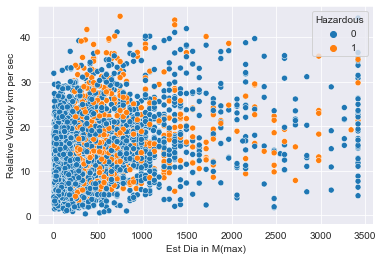

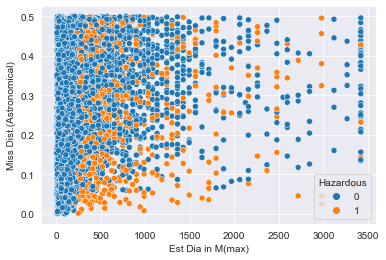

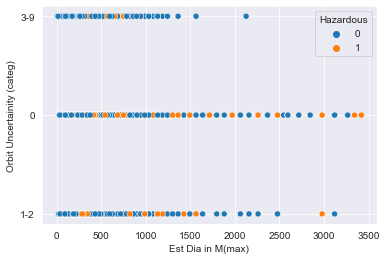

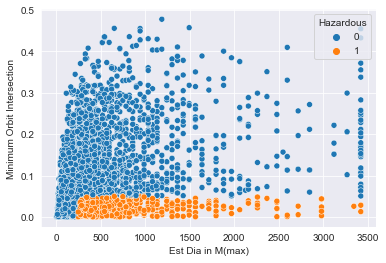

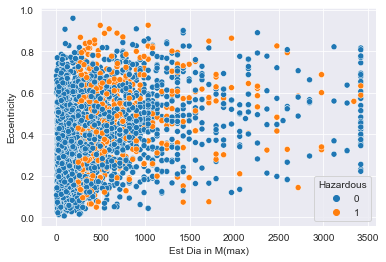

...

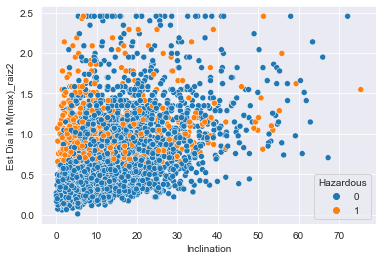

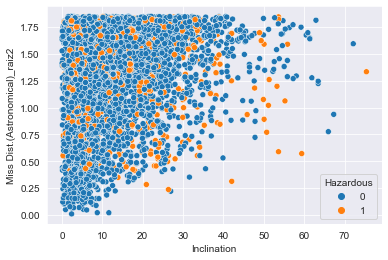

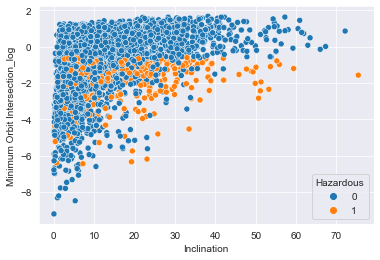

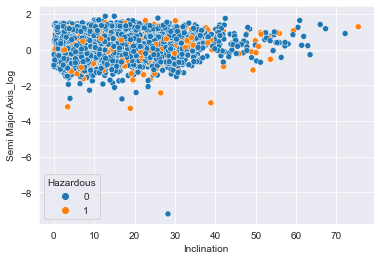

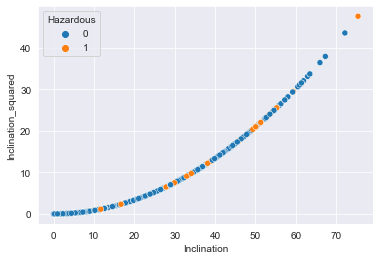

KeyboardInterrupt: 

In [39]:
# Si queremos un gráfico en particular:

for col_x in X_transf.columns: # con representar las variabs en su mejor transformación (input_transf), nos vale
    for col_y in X_transf.columns:
        if col_x == col_y:
            continue
        plt.clf()
        sns.scatterplot(data=data_transf, x=col_x, y=col_y, hue="Hazardous") # lo que pone en data es fácil, piénsalo ;)
        #sns.boxplot(x='long',y='Luxury',data=viviendasDep,palette='viridis')
        plt.show()

Solo hemos visualizado la relación entre pares de variabs con la variab objetivo, pero no hemos incluido las interacciones como tal en el dataset. Es porque lo haremos en el pipeline ;)

----
## Train Test Split

Nota: hemos decidido no trabajar con set de validación. Se suele utilizar para cosas como implementar técnicas de _early stopping_, o para ajustar los hiperparámetros del modelo, pero en nuestro caso lo haremos mediante validación cruzada.

In [40]:
seed = 99

X_train, X_test, y_train, y_test = train_test_split(X_transf, y,
                                                    test_size=0.2,
                                                    stratify=y,
                                                    random_state=seed)

# stratify=y indica que la división en train y test debe preservar la proporción de clases de la variable "y" en train y test
# Hacemos esto para mejorar la capacidad del conjunto test de poner a prueba adecuadamente el modelo

# Agregar columna de etiquetas --> para guardar todo el dataset preprocesado sin perder la separación entre train y test
X_train['Dataset'] = 'train'
X_test['Dataset'] = 'test'

In [41]:
# comprobaciones
print(X_train.shape, X_test.shape)
print(y_train.shape, y_test.shape)

(3749, 23) (938, 23)
(3749,) (938,)


In [42]:
print(y_test.value_counts())

(y_test.value_counts(normalize=True)*100).round(2)

0    787
1    151
Name: Hazardous, dtype: int64


0    83.9
1    16.1
Name: Hazardous, dtype: float64

### Exportar datos

In [44]:
# Concatenar X e y
df_train = pd.concat([X_train, y_train], axis=1) # axis=1 porque se unen columnas
df_test = pd.concat([X_test, y_test], axis=1)

# Concatenar train y test
data_labeled = pd.concat([df_train, df_test], axis=0) # axis=0 porque se unen filas

In [ ]:
[col for col in data_labeled.columns]

In [46]:
# # pequeña comprobación
# data_labeled.isna().sum()

In [47]:
# Exportar datos depurados a un archivo csv
data_labeled.to_csv('Datasets/datos_procesados.csv', index=False)

Cosas que hemos tratado:
- con primer cribado de variables (irrelevantes y colineales)
- sin missings
- sin outliers
- con transformaciones

Cosas pendientes:
- sin interacciones
- variabs numéricas sin escalar
- variab categ sin codificar
- datos desbalanceados